In [10]:
# The following functions can be used to convert a value to a type compatible
# with tf.Example.

def _bytes_feature(value):
  """Returns a bytes_list from a string / byte."""
  if isinstance(value, type(tf.constant(0))):
    value = value.numpy() # BytesList won't unpack a string from an EagerTensor.
  return tf.train.Feature(bytes_list=tf.train.BytesList(value=[value]))

def _float_feature(value):
  """Returns a float_list from a float / double."""
  return tf.train.Feature(float_list=tf.train.FloatList(value=[value]))

def _int64_feature(value):
  """Returns an int64_list from a bool / enum / int / uint."""
  return tf.train.Feature(int64_list=tf.train.Int64List(value=[value]))

In [16]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import tensorflow as tf

#construct list for image paths and their corresponding masks in the same order
#image_path = "../data/train/*.jpg"
image_path = []
for filename in os.listdir("img-jpg/"):
    image_path.append("img-jpg/" + filename)

mask_path = []
for filename in os.listdir("gt-jpg/"):
    mask_path.append("gt-jpg/" + filename)

In [12]:
# path to where the tfrecords will be stored (change to your customized path).
# I can't run this here in Kaggle because of permission. 
# Any comment on how to write temporary files in Kaggle will be appreciated.
tfrecords_filename = 'gt.tfrecords'
#get a writer for the tfrecord file.
writer = tf.compat.v1.python_io.TFRecordWriter(tfrecords_filename)
#write data/masks into tfrecords
for i in range(len(image_path)):
    img = np.array(mpimg.imread(image_path[i]))
    mask = np.array(mpimg.imread(mask_path[i]))[:,:]

    height = img.shape[0]
    width = img.shape[1]
    img_raw = img.tostring()
    mask_raw = mask.tostring()
    #save the heights and widths as well so, which 
    #are needed when decoding from tfrecords back to images
    example = tf.train.Example(features=tf.train.Features(feature={
                                                          'height': _int64_feature(height),
                                                          'width': _int64_feature(width),
                                                          'image_raw': _bytes_feature(img_raw),
                                                          'mask_raw': _bytes_feature(mask_raw)}
                                                          ))
    writer.write(example.SerializeToString())
writer.close()

Instructions for updating:
Use eager execution and: 
`tf.data.TFRecordDataset(path)`


C:\Users\loand\Anaconda3\envs\malaria_detection\lib\site-packages\ipykernel_launcher.py:10: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  # Remove the CWD from sys.path while we load stuff.
C:\Users\loand\Anaconda3\envs\malaria_detection\lib\site-packages\ipykernel_launcher.py:11: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  # This is added back by InteractiveShellApp.init_path()


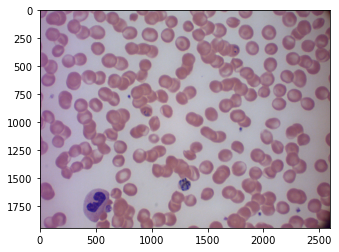

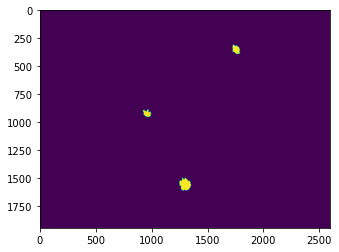

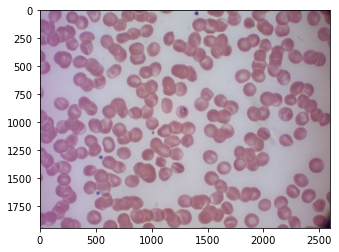

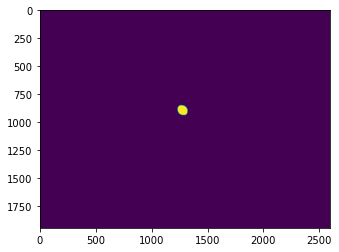

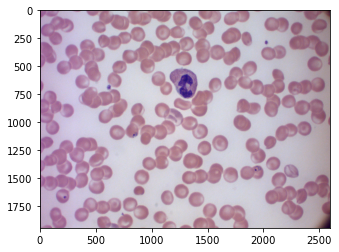

...

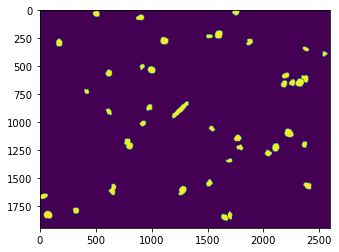

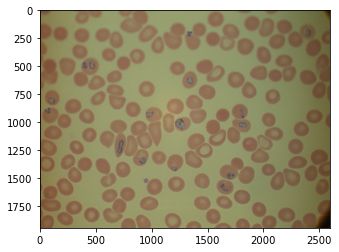

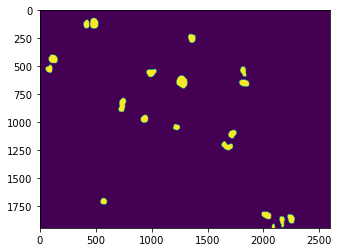

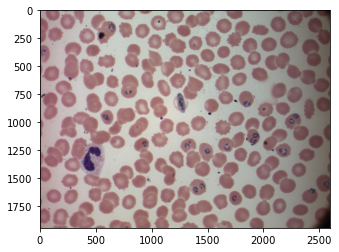

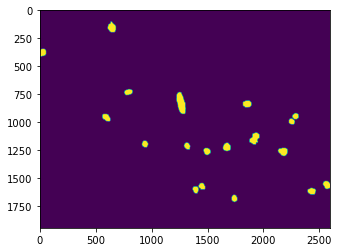

In [14]:
#run the following to verify the created tfrecord file.
record_iterator = tf.compat.v1.python_io.tf_record_iterator(path=tfrecords_filename)
for string_record in record_iterator:
    example = tf.train.Example()
    example.ParseFromString(string_record)
    height = int(example.features.feature['height'].int64_list.value[0])
    width = int(example.features.feature['width'].int64_list.value[0])
    img_string = (example.features.feature['image_raw'].bytes_list.value[0])
    mask_string = (example.features.feature['mask_raw'].bytes_list.value[0])
    img_1d = np.fromstring(img_string, dtype=np.uint8)
    mask_1d = np.fromstring(mask_string, dtype=np.uint8)
    #reshape back to their original shape from a 1D array read from tfrecords
    img = img_1d.reshape((height, width, -1))
    mask = mask_1d.reshape((height, width))
    plt.imshow(img)
    plt.show()
    plt.imshow(mask)
    plt.show()